In [4]:
# Step - 4.1 code to generate single csv file for each subjects
import os
import pandas as pd

data_path = './Step-2 Cleaned Data'
for test in ["Speech"]:
    for folder_name in os.listdir(data_path):
        appended_data = pd.DataFrame()
        
        subject_folder = os.path.join(data_path, folder_name)
        print(subject_folder +" - " +folder_name)

        for each_subject_test_folder in os.listdir(subject_folder):
            access_test = os.path.join(subject_folder, each_subject_test_folder + "/" + test)

            for filename in os.listdir(access_test):
                if filename.endswith(".csv"):
                    file_path = os.path.join(access_test, filename)
                    df = pd.read_csv(file_path)
                    del df['TimeStamp']
                    df['Output'] = each_subject_test_folder.strip()

                    # Remove rows where any value is equal to 0
                    df = df[(df != 0).all(axis=1)]

                    if not df.empty:
                        appended_data = pd.concat([appended_data, df], ignore_index=True)

        if not os.path.exists("./Step-4 Single CSV"):
            os.makedirs("./Step-4 Single CSV", exist_ok=True)

        output_file_path = os.path.join("./Step-4 Single CSV", f"{folder_name}_{test}_data.csv")
        appended_data.to_csv(output_file_path, index=False)

./Step-2 Cleaned Data\Akil - Akil
./Step-2 Cleaned Data\Jyaswanth Sai - Jyaswanth Sai
./Step-2 Cleaned Data\Prithivi Raaj - Prithivi Raaj
./Step-2 Cleaned Data\Santhosh - Santhosh
./Step-2 Cleaned Data\Venkatprasadh - Venkatprasadh


C:\Users\abaii\AppData\Local\Temp\ipykernel_20700\645902905.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Output', y=column, data=df, palette="Set3")
C:\Users\abaii\AppData\Local\Temp\ipykernel_20700\645902905.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Output', y=column, data=df, palette="Set3")
C:\Users\abaii\AppData\Local\Temp\ipykernel_20700\645902905.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Output', y=column, data=df, palette="Set3")
C:\Users\abaii\AppData\Local\Temp\ipykernel_20700\645902905.py:16: 

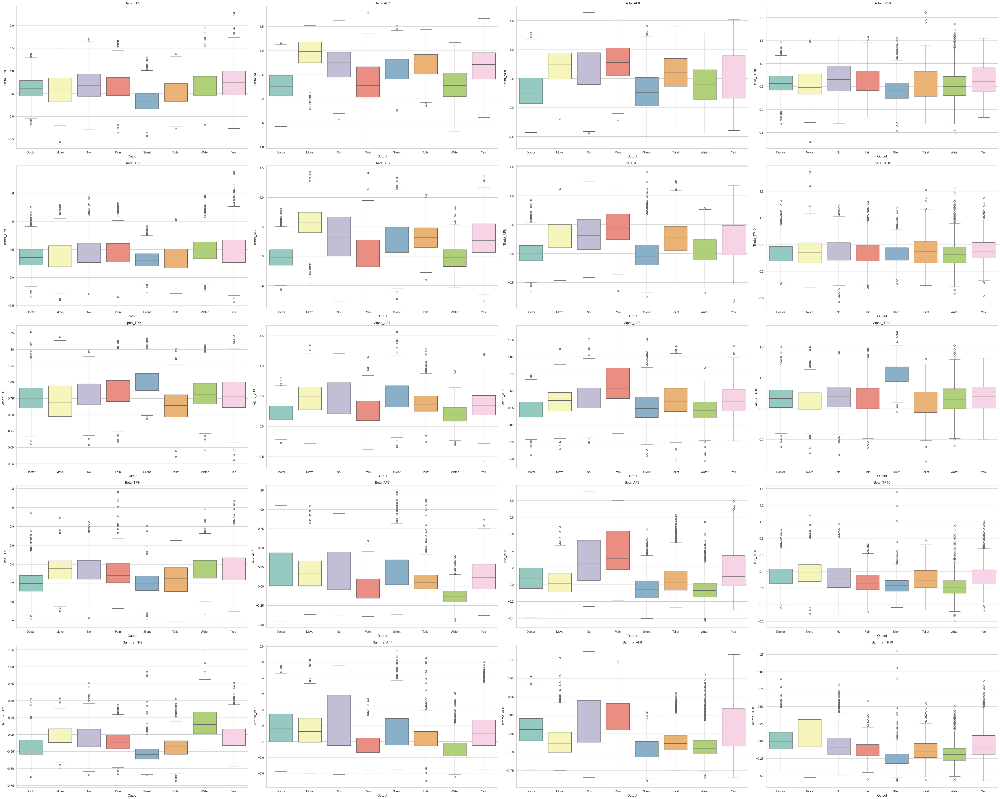

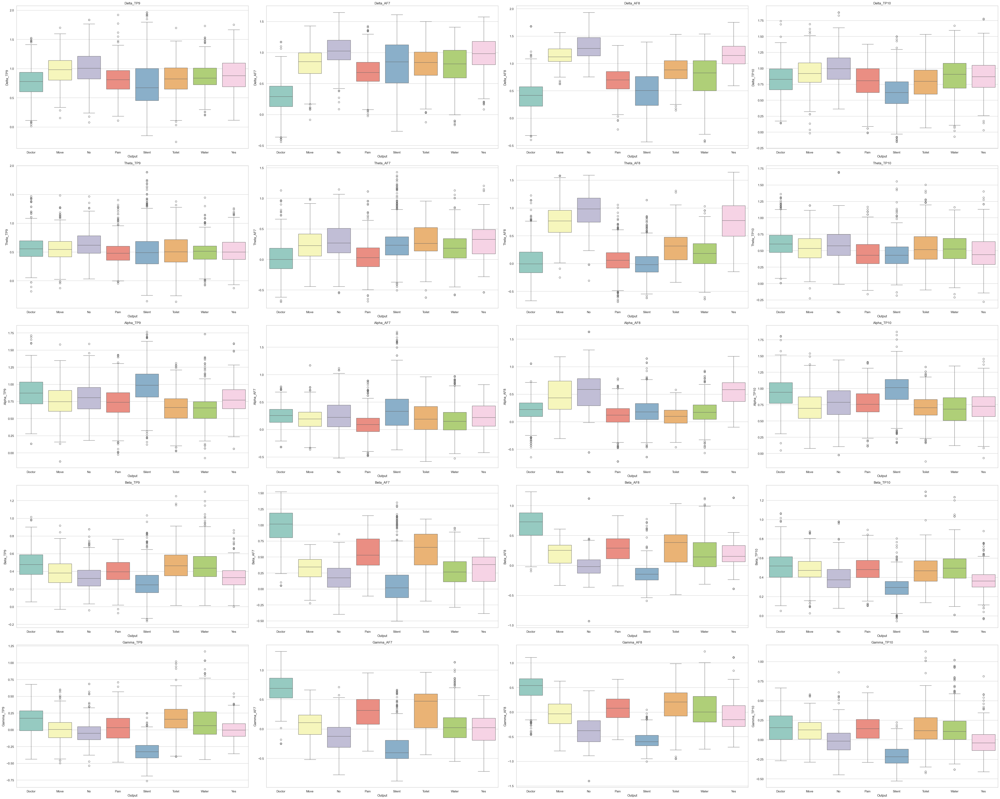

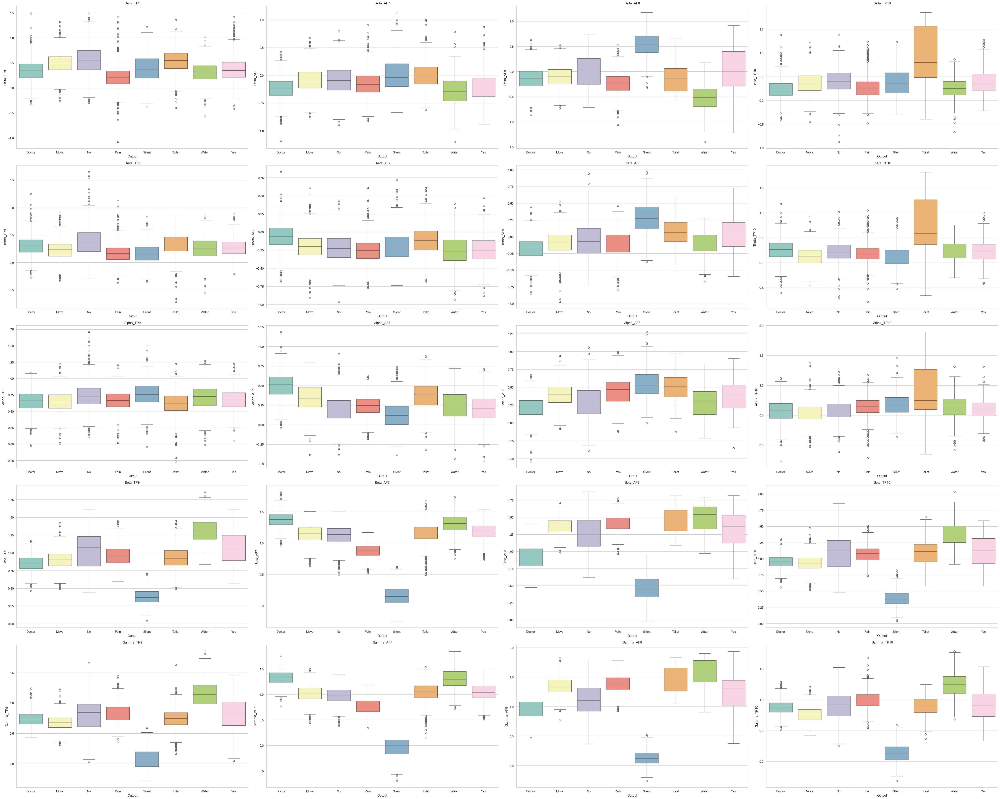

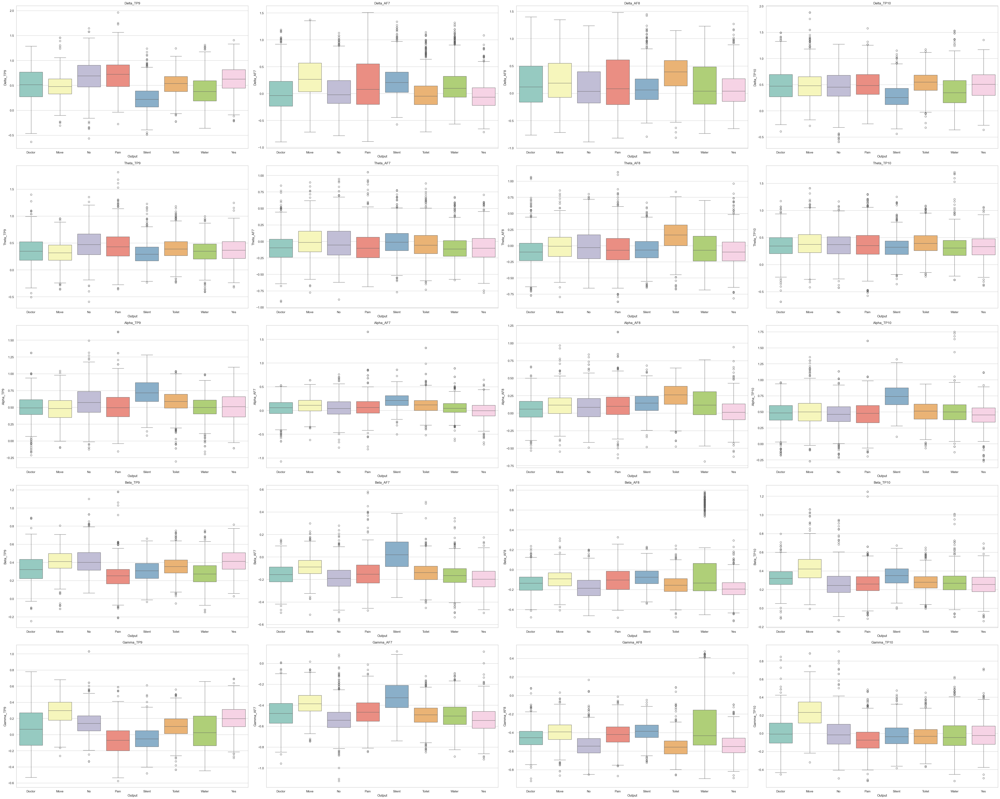

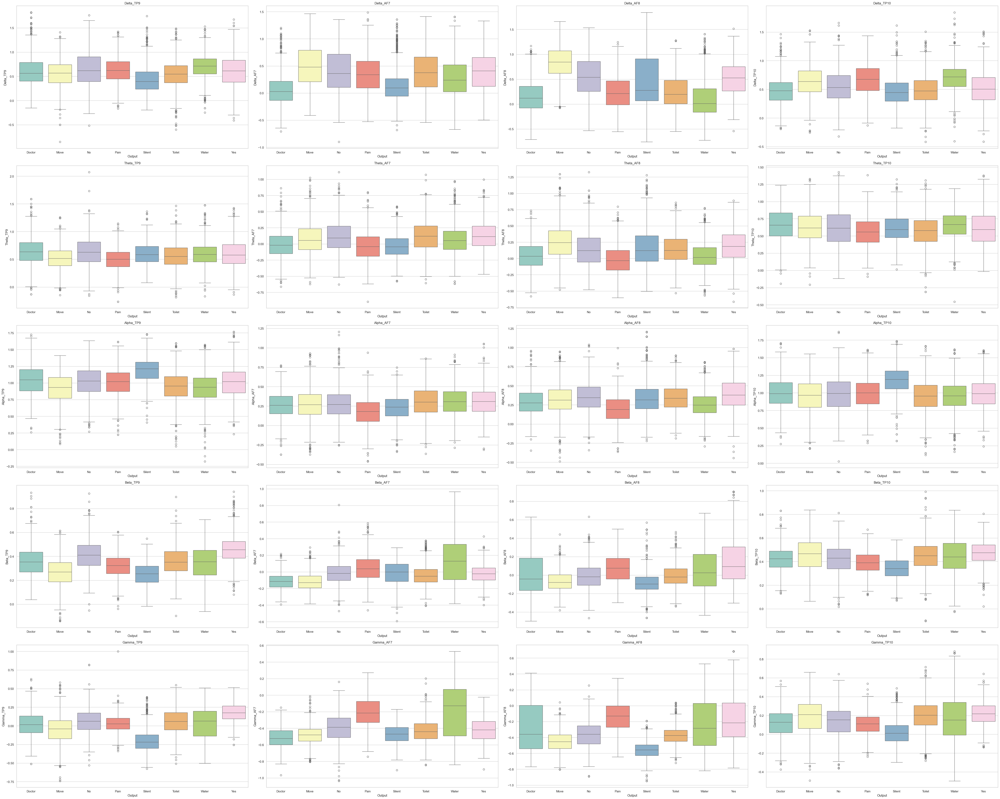

In [5]:
# Step 4.2. It generates Box plot for each subjects
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

save = "./Step-4 Single CSV/Box Plot"
for filename in os.listdir("./Step-4 Single CSV"):
    df = pd.read_csv(os.path.join("./Step-4 Single CSV", filename))
    plt.figure(figsize=(50, 40))
    sns.set(style="whitegrid")

    # Loop through each column in the DataFrame
    for column in df.columns[:-1]:
        plt.subplot(5, 4, df.columns.get_loc(column) + 1)
        sns.boxplot(x='Output', y=column, data=df, palette="Set3")
        plt.title(column)
    plt.tight_layout()

    if not os.path.exists(save):
        os.makedirs(save, exist_ok=True)

    plt.savefig(os.path.join(save, f"{filename}_box_plot.png"), format='png')
    # plt.show()

C:\Users\abaii\AppData\Local\Temp\ipykernel_20700\2822143042.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Output', y=column, data=df, palette="Set3")
C:\Users\abaii\AppData\Local\Temp\ipykernel_20700\2822143042.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Output', y=column, data=df, palette="Set3")
C:\Users\abaii\AppData\Local\Temp\ipykernel_20700\2822143042.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Output', y=column, data=df, palette="Set3")
C:\Users\abaii\AppData\Local\Temp\ipykernel_20700\28221

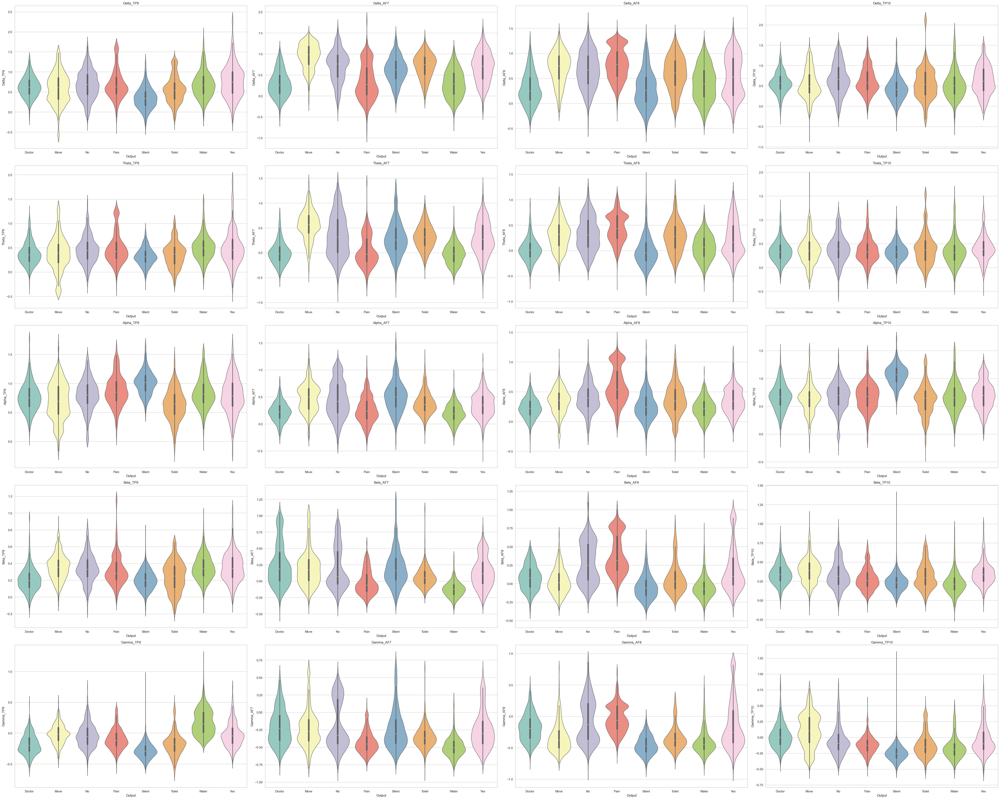

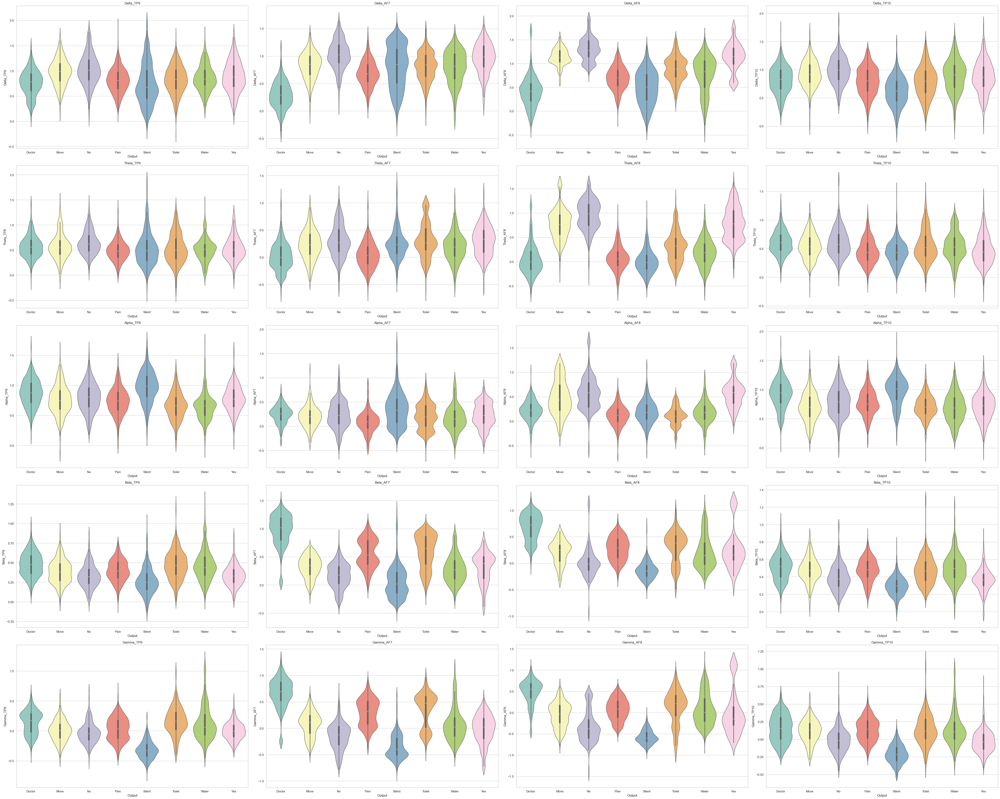

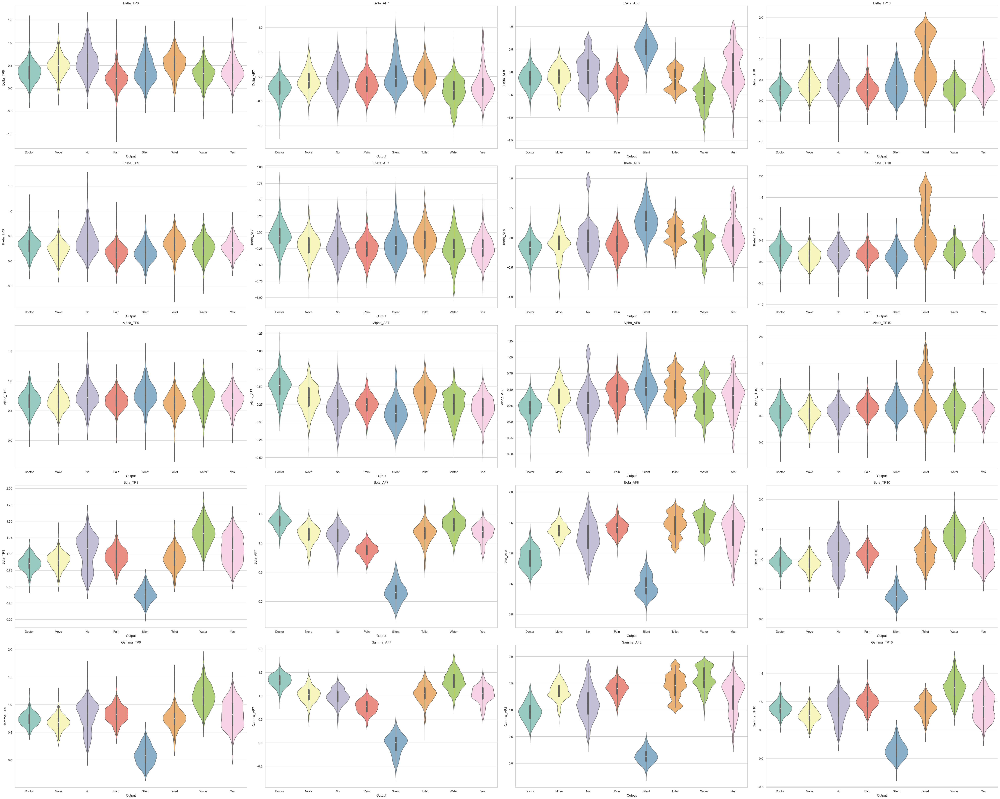

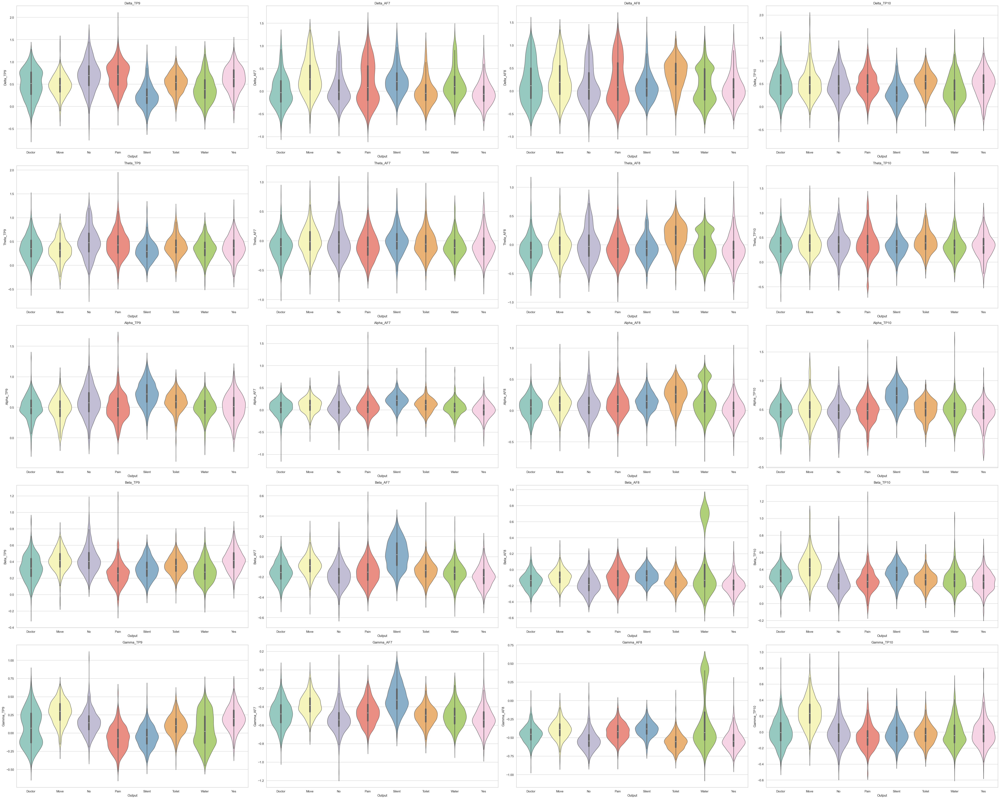

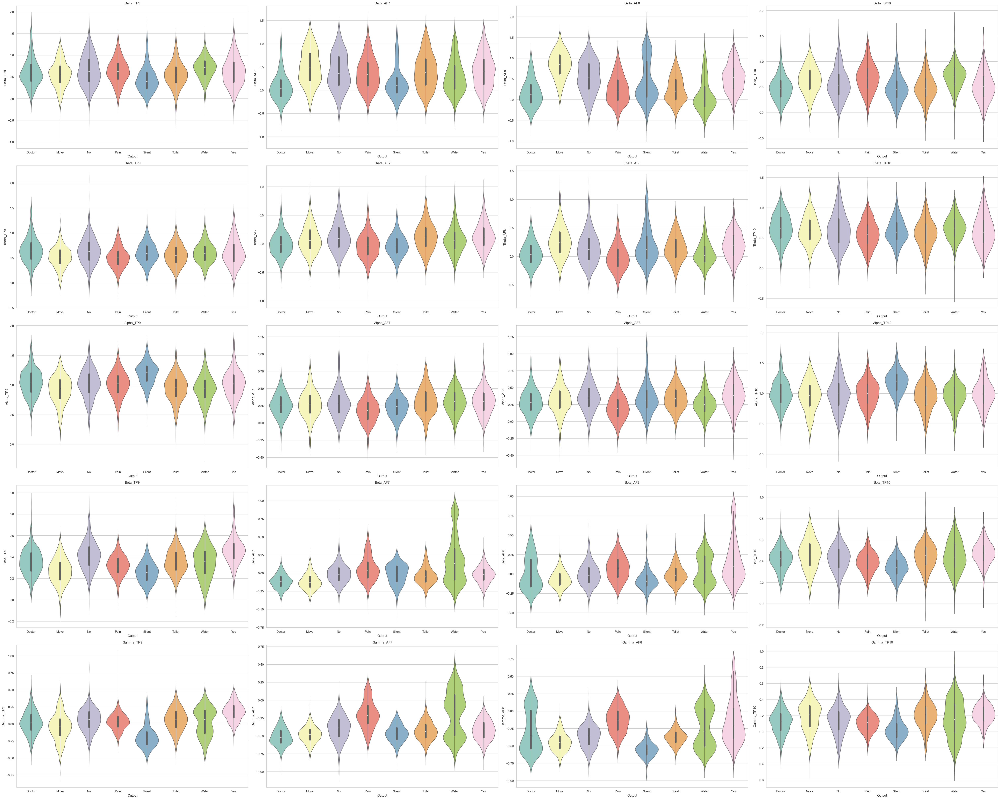

In [6]:
# Step - 4.3 It generates Violin Plot for all
save_directory = "./Step-4 Single CSV/Violin Plot"
for filename in os.listdir("./Step-4 Single CSV"):
    if filename.endswith(".csv"):
        file_path = os.path.join("./Step-4 Single CSV", filename)
        df = pd.read_csv(file_path)

        # Create violin plots for each column
        plt.figure(figsize=(50, 40))
        sns.set(style="whitegrid")
        for i, column in enumerate(df.columns[:-1]):
            plt.subplot(5, 4, i + 1)
            sns.violinplot(x='Output', y=column, data=df, palette="Set3")
            plt.title(column)
        plt.tight_layout()

        if not os.path.exists(save_directory):
            os.makedirs(save_directory, exist_ok=True)
        save_path = os.path.join(save_directory, f"{filename}_violin_plot.png")
        plt.savefig(save_path, format='png')
        # plt.show()

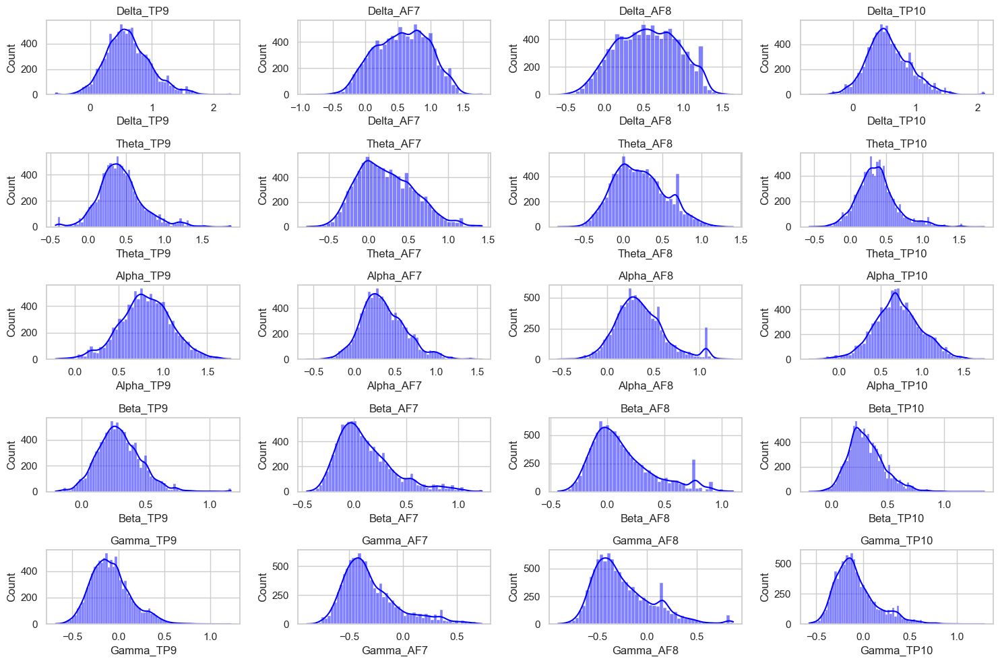

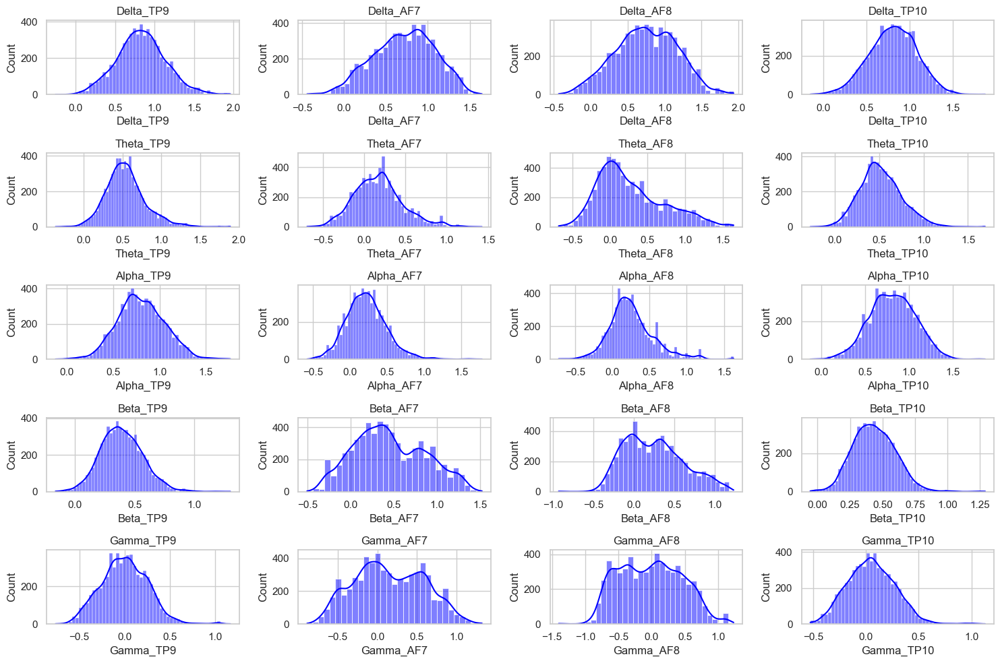

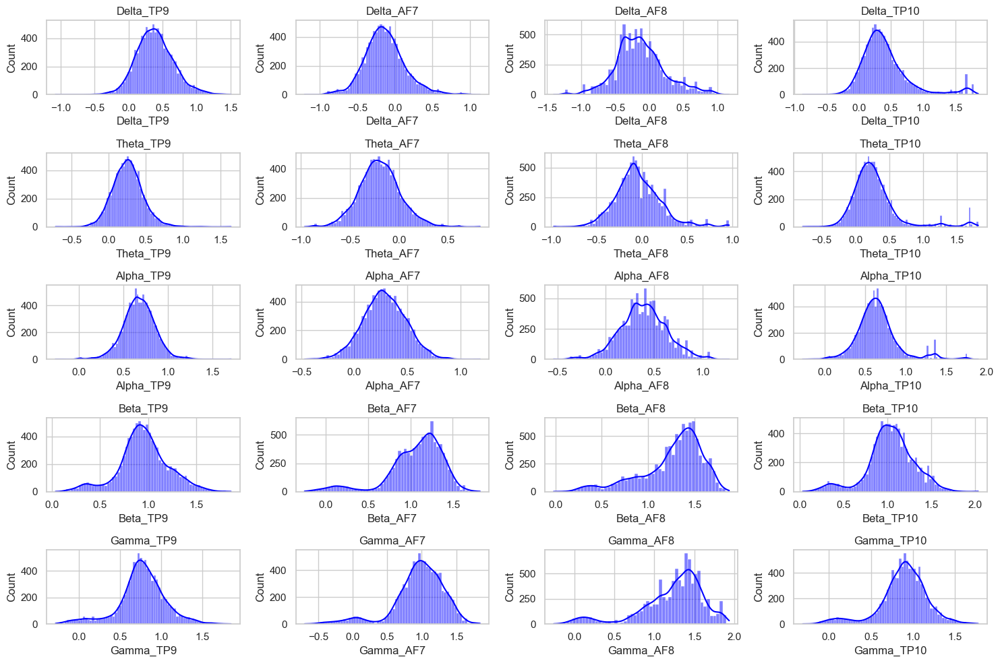

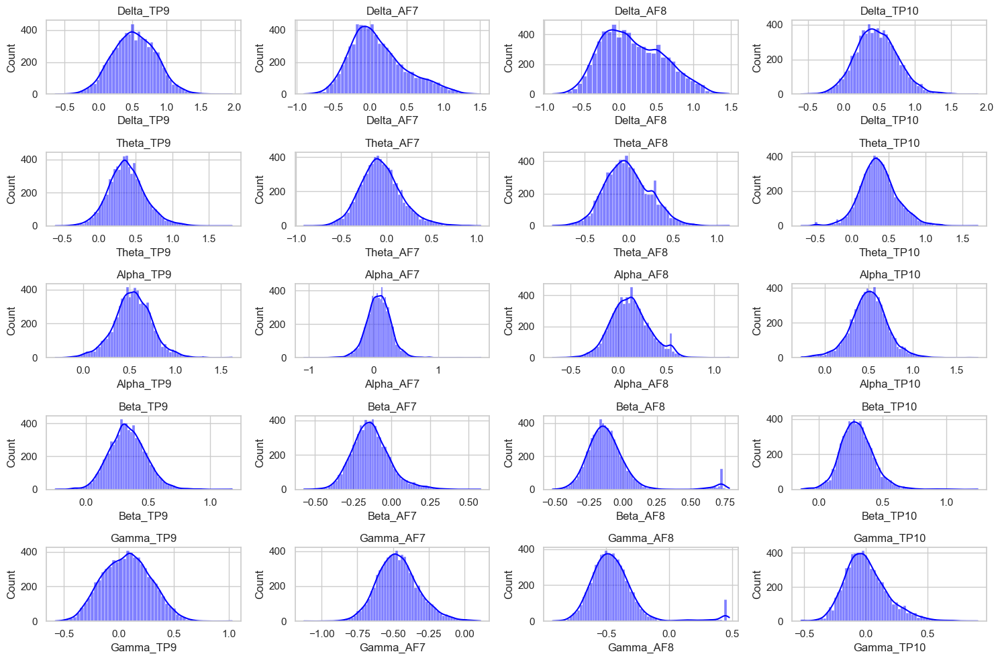

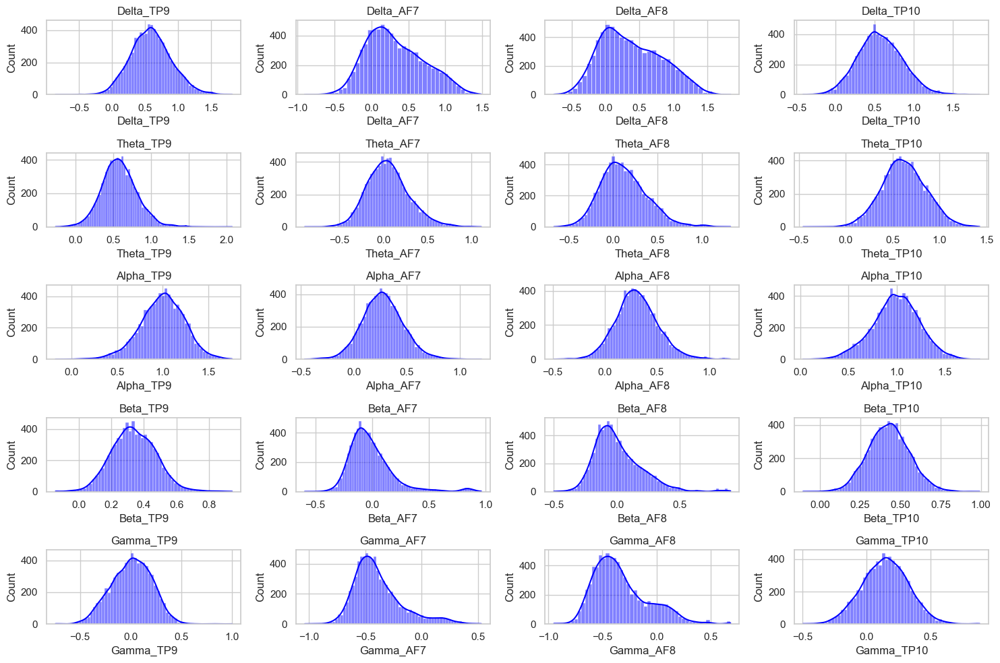

In [7]:
# Step - 4.4 It generates Normal Distribution Graph for all
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

save_directory = "./Step-4 Single CSV/Normal Distribution"

for filename in os.listdir("./Step-4 Single CSV"):
    if filename.endswith(".csv"):
        file_path = os.path.join("./Step-4 Single CSV", filename)
        df = pd.read_csv(file_path)

        # Create violin plots for each column
        plt.figure(figsize=(15, 10))
        sns.set(style="whitegrid")

        for i, column in enumerate(df.columns[:-1]):
            plt.subplot(5, 4, i + 1)
            sns.histplot(df[column], kde=True, color='blue')
            plt.title(column)

        plt.tight_layout()

        if not os.path.exists(save_directory):
            os.makedirs(save_directory, exist_ok=True)
        save_path = os.path.join(save_directory, f"{filename}_Normal Distr_plot.png")
        plt.savefig(save_path, format='png')
        # plt.show()

In [9]:
import pandas as pd

df1 = pd.read_csv("./Step-5 Combined CSV/Normalized_Speech.csv")

summary_stats = df1.describe().transpose()
print(summary_stats[['mean', 'std']])

                mean       std
Delta_TP9  -0.030102  0.952793
Delta_AF7  -0.027622  0.966694
Delta_AF8  -0.019351  0.940918
Delta_TP10 -0.060863  0.922871
Theta_TP9  -0.037876  0.932302
Theta_AF7  -0.045762  0.924145
Theta_AF8  -0.068104  0.909042
Theta_TP10 -0.056553  0.899827
Alpha_TP9  -0.017948  0.968670
Alpha_AF7  -0.044545  0.927373
Alpha_AF8  -0.079532  0.905372
Alpha_TP10 -0.031681  0.960354
Beta_TP9   -0.052930  0.937551
Beta_AF7   -0.042214  0.981088
Beta_AF8   -0.043070  0.971026
Beta_TP10  -0.049957  0.930937
Gamma_TP9  -0.035795  0.950213
Gamma_AF7  -0.036726  0.977723
Gamma_AF8  -0.035852  0.967873
Gamma_TP10 -0.032341  0.955371
